In [1]:
k=6 
import cv2
import numpy as np

N = 5
global n 
n = 0 
ps=[]
ims=[]
ims_copy=[]
params=[]
def sift(im1,im2):
    img1=cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)
    img2=cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)
    sift =  cv2.xfeatures2d.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)
    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 10)
    search_params = dict(checks = 50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)
    if len(good)>10:
        dst_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        src_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
        h,w = img1.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,M)
        return (pts,dst,M)

    else:
        return ("Not enough matches are found - %d/%d" % (len(good),10))    

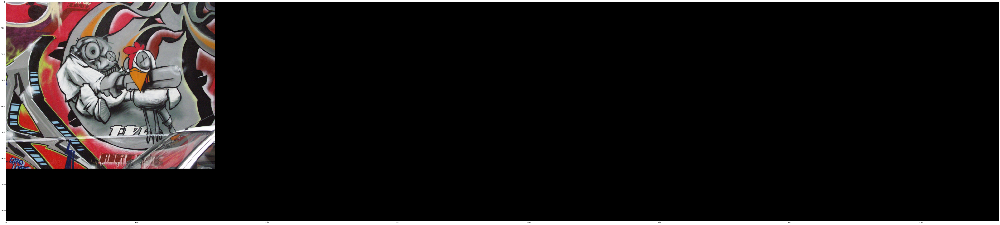

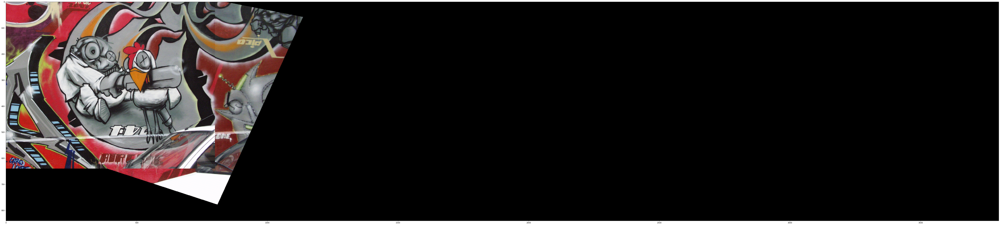

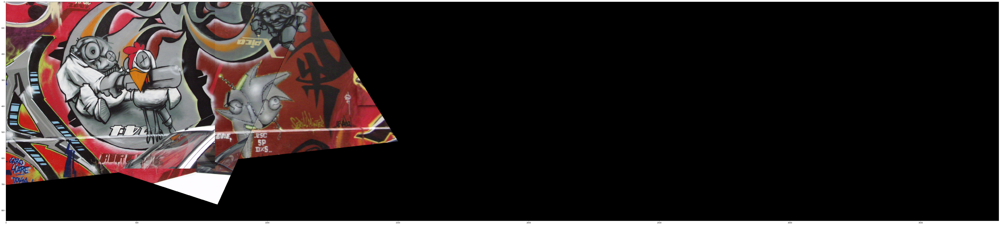

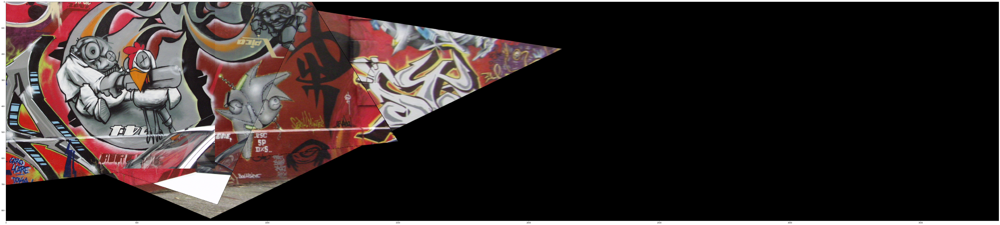

In [5]:
height=200
width=3000
num=4

import matplotlib.pyplot as plt
im_ref=cv2.imread('images/graf/img1.ppm', cv2.IMREAD_ANYCOLOR)
shape=(im_ref.shape[1]+width,im_ref.shape[0]+height)
blank=np.zeros((im_ref.shape[0]+height,im_ref.shape[1]+width,3),dtype='uint8')
blank[0:im_ref.shape[0], 0:im_ref.shape[1]] = im_ref

blank_cvt=cv2.cvtColor(blank,cv2.COLOR_BGR2RGB)
for i in range(1,num+1):
    im_src=cv2.imread('images/graf/img%d.ppm'%i, cv2.IMREAD_ANYCOLOR)
    im_dst=im_ref
    pts_src,pts_dst,h=sift(im_dst,im_src)
    #marg = cv2.polylines(blank,[np.int32(pts_dst)],True,255,10, cv2.LINE_AA)
    hom = cv2.warpPerspective(im_src, h, shape)
    blank+=(blank==0)*hom
    hom_dir='stitched_images/stitched_%d.jpeg'%i
    #cv2.imwrite(hom_dir,blank)
    blank_cvt=cv2.cvtColor(blank,cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(100,100))
    plt.imshow(blank_cvt)
    plt.show()
